CHAPTER 2

In [1]:
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit

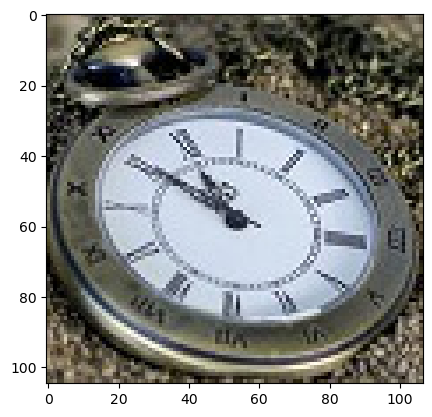

(<matplotlib.image.AxesImage at 0x1d467d13560>, None)

In [2]:
# Up-sampling

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\clock.jpg") # the original small clock image
pylab.imshow(im), pylab.show()

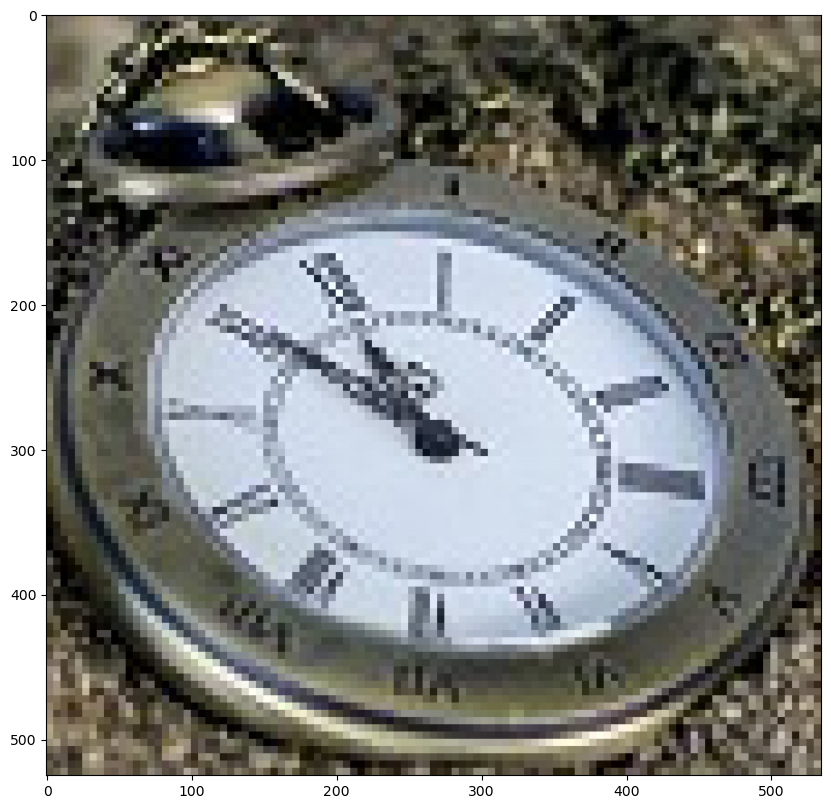

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [3]:
im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

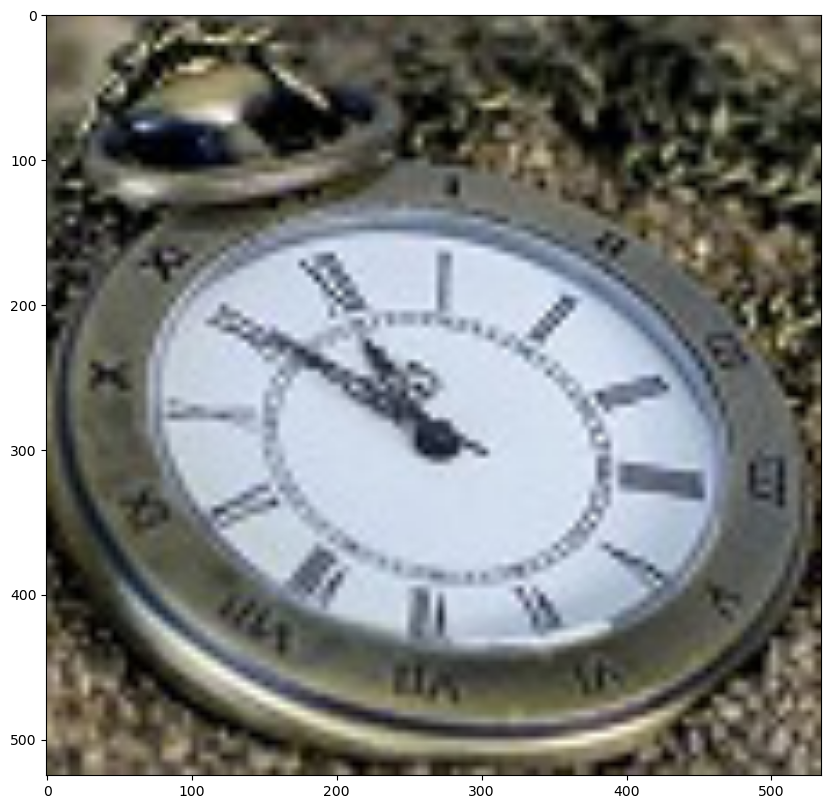

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [4]:
# Up-sampling and interpolation
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

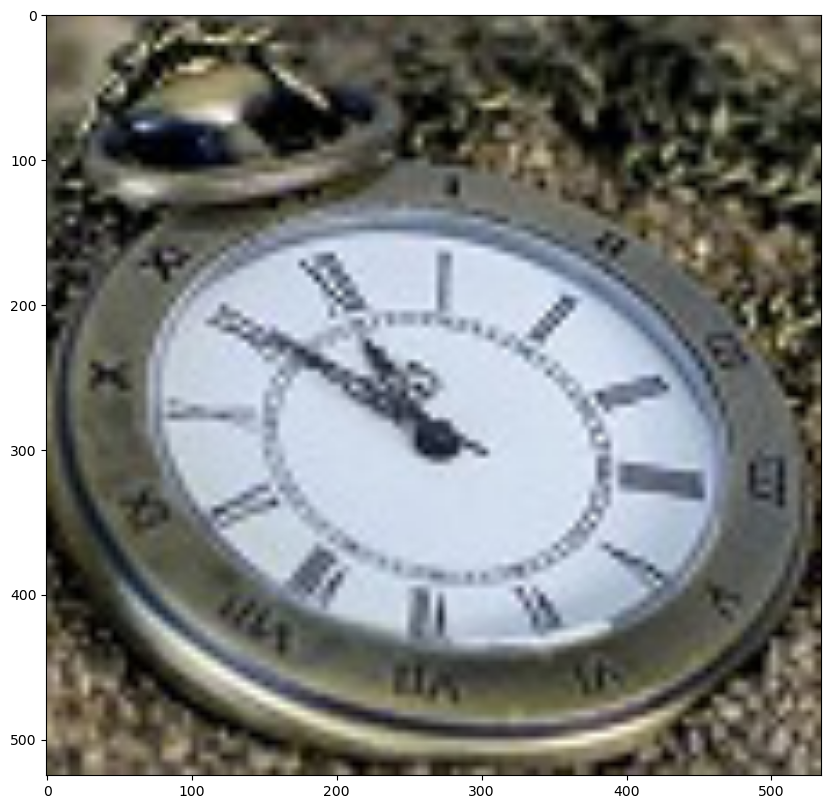

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [5]:
# Bi-cubic interpolation

im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

In [6]:
# Down-sampling

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\tajmahal.jpg")
im.show()

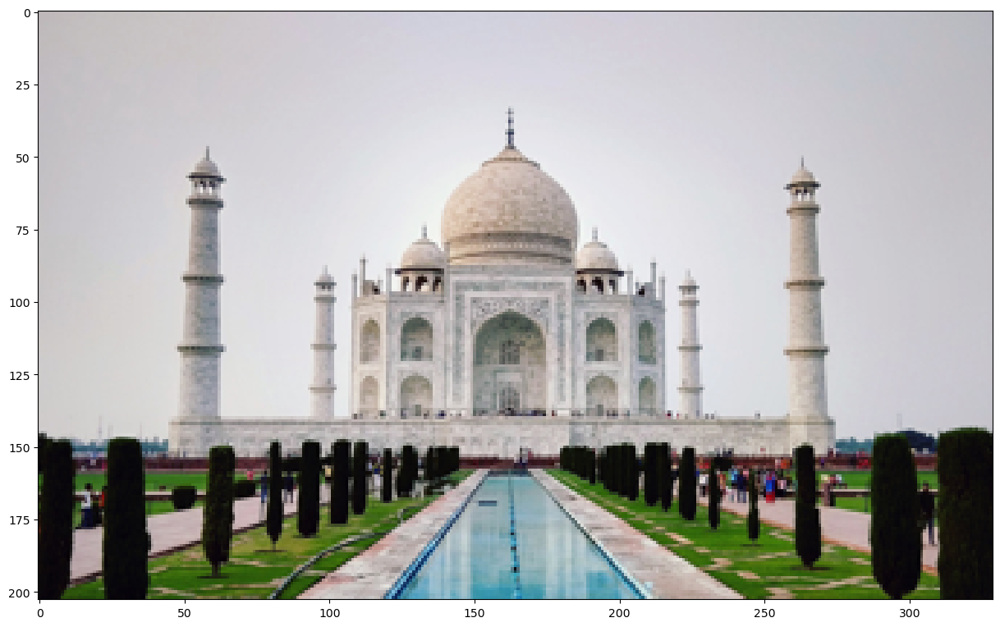

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [7]:
im = im.resize((im.width//5, im.height//5))
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

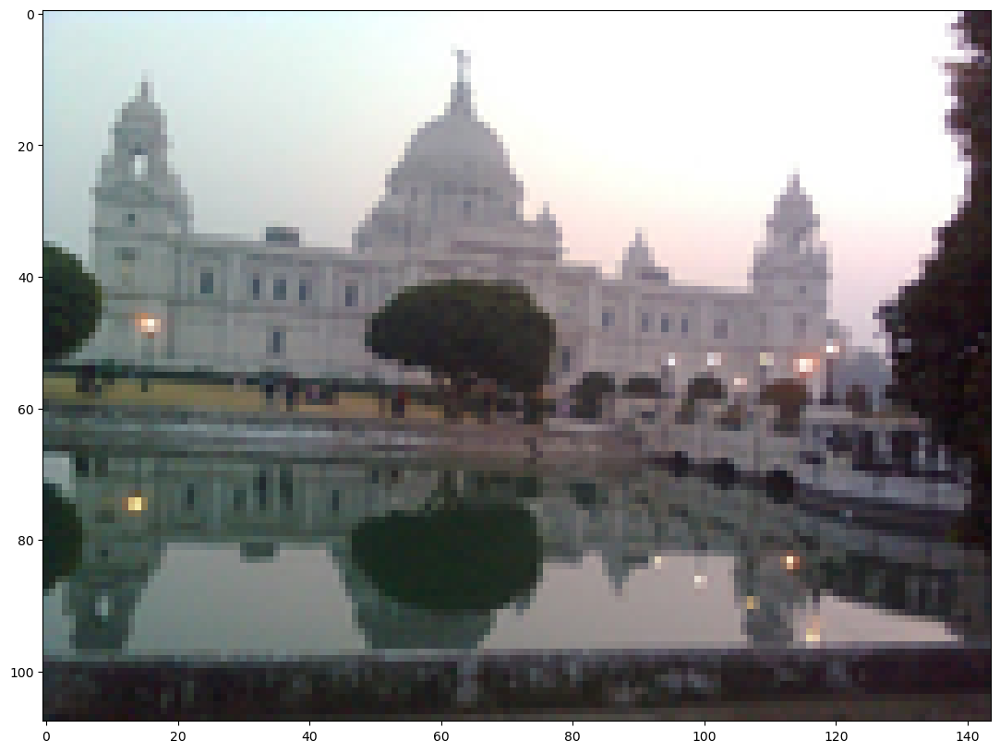

In [8]:
# Down-sampling and anti-aliasing

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\victoria_memorial.png")

# Resize the image using LANCZOS (anti-aliasing)
im_small = im.resize((im.width // 5, im.height // 5), Image.Resampling.LANCZOS)

# Display the resized image
pylab.figure(figsize=(15, 10))
pylab.imshow(im_small)
pylab.show()

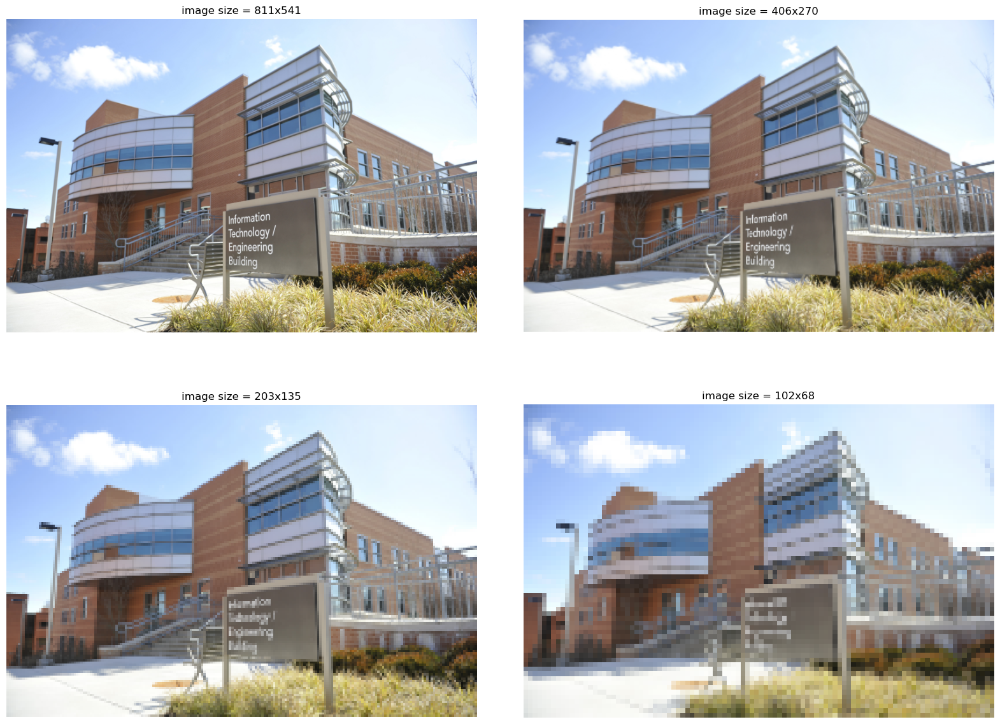

In [9]:
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import rescale

# Đọc ảnh từ đường dẫn
im = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\umbc.png')
im1 = im.copy()

# Tạo figure và hiển thị ảnh
plt.figure(figsize=(20, 15))
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(im1, cmap='gray')
    plt.axis('off')
    plt.title('image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))
    
    # Giảm kích thước ảnh xuống 50%
    im1 = rescale(im1, scale=0.5, channel_axis=-1, anti_aliasing=False)

plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()


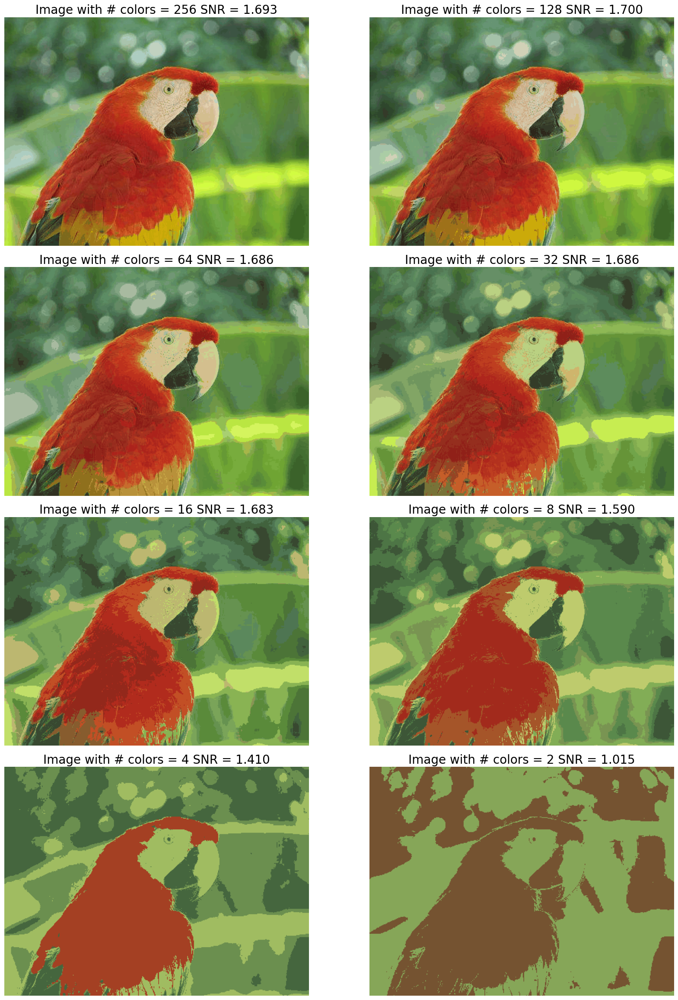

In [10]:
# Quantizing with PIL

from PIL import Image
import numpy as np
import pylab

# Custom Signal-to-Noise Ratio function
def signaltonoise(image, axis=None):
    array = np.asarray(image)
    mean = np.mean(array)
    std = np.std(array)
    return mean / std if std != 0 else float('inf')

# Open image
im = Image.open('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.jpg')

# Plot setup
pylab.figure(figsize=(20, 30))

# Number of colors list (powers of 2)
num_colors_list = [1 << n for n in range(8, 0, -1)]
snr_list = []

# Process each number of colors
for i, num_colors in enumerate(num_colors_list, start=1):
    # Convert image to 'P' mode with adaptive palette
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    
    # Calculate SNR
    snr = signaltonoise(im1, axis=None)
    snr_list.append(snr)
    
    # Plot the image
    pylab.subplot(4, 2, i)
    pylab.imshow(im1)
    pylab.axis('off')
    pylab.title(f'Image with # colors = {num_colors} SNR = {snr:.3f}', size=20)

# Adjust layout and display
pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()



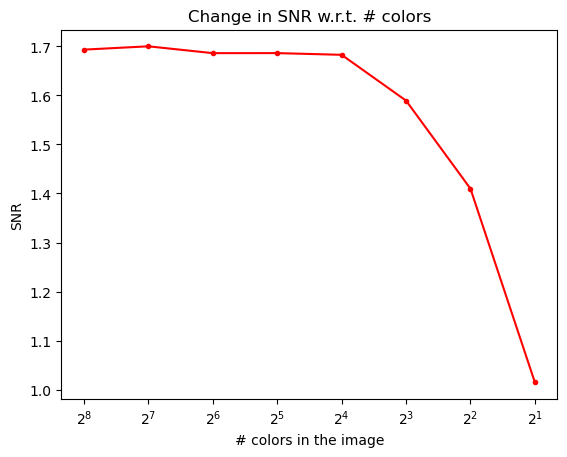

In [11]:
pylab.plot(num_colors_list, snr_list, 'r.-')
pylab.xlabel('# colors in the image')
pylab.ylabel('SNR')
pylab.title('Change in SNR w.r.t. # colors')
pylab.xscale('log', base=2)  # Use 'base' instead of 'basex'
pylab.gca().invert_xaxis()
pylab.show()


SNR for the original image = 2.365477097885269
SNR for the image obtained after reconstruction = 2.3654770978852695


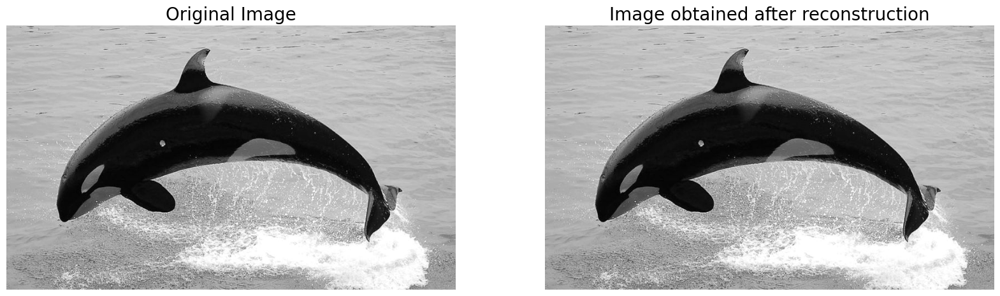

In [27]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as pylab
# Hàm tính SNR (Signal-to-Noise Ratio)
def signaltonoise(image, axis=None):
    array = np.asarray(image)
    mean = np.mean(array)
    std = np.std(array)
    return mean / std if std != 0 else float('inf')

# Đọc ảnh và chuyển đổi sang ảnh xám (grayscale)
im = np.array(Image.open('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\whale.jpg').convert('L'))  # Đường dẫn tới ảnh

# Tính SNR của ảnh gốc
snr = signaltonoise(im, axis=None)
print(f'SNR for the original image = {snr}')

# Thực hiện FFT và IFFT
freq = np.fft.fft2(im)  # Chuyển đổi Fourier nhanh 2D
im1 = np.fft.ifft2(freq).real  # Chuyển ngược Fourier (phần thực)

# Tính SNR của ảnh tái tạo
snr_reconstructed = signaltonoise(im1, axis=None)
print(f'SNR for the image obtained after reconstruction = {snr_reconstructed}')

# Kiểm tra xem ảnh ban đầu và ảnh tái tạo có tương tự nhau không
assert np.allclose(im, im1), "The original and reconstructed images are not numerically close."

# Hiển thị ảnh gốc và ảnh tái tạo
pylab.figure(figsize=(20, 10))
# Ảnh gốc
pylab.subplot(121)
pylab.imshow(im, cmap='gray')
pylab.axis('off')
pylab.title('Original Image', size=20)

# Ảnh tái tạo
pylab.subplot(122)
pylab.imshow(im1, cmap='gray')
pylab.axis('off')
pylab.title('Image obtained after reconstruction', size=20)
pylab.show()


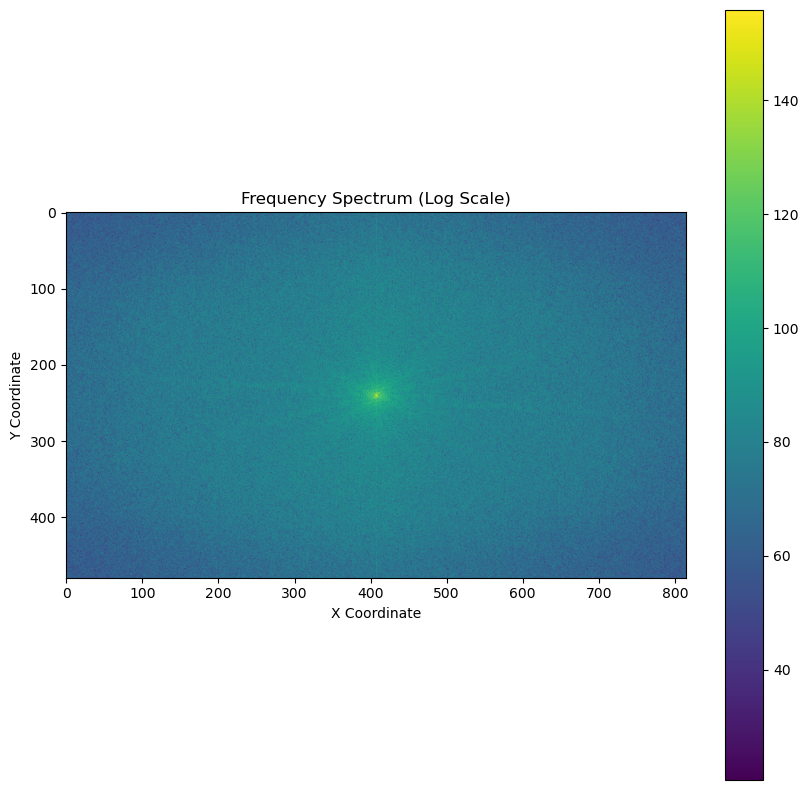

In [28]:
# Plotting the frequency spectrum

import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack as fp

# Giả sử 'image' là hình ảnh đầu vào ở dạng mảng numpy 2D
im = np.array(Image.open('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\whale.jpg').convert('L'))

# Thực hiện biến đổi Fourier 2D
freq = fp.fft2(im)

# Dịch chuyển các thành phần tần số để tần số thấp ở trung tâm
freq2 = fp.fftshift(freq)

# Tính phổ tần số và hiển thị logarit của phổ Fourier
plt.figure(figsize=(10, 10))
plt.imshow((20 * np.log10(0.1 + np.abs(freq2))), cmap='viridis')  # Sử dụng cmap 'viridis' để giống hình mẫu
plt.colorbar()
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.title("Frequency Spectrum (Log Scale)")
plt.show()





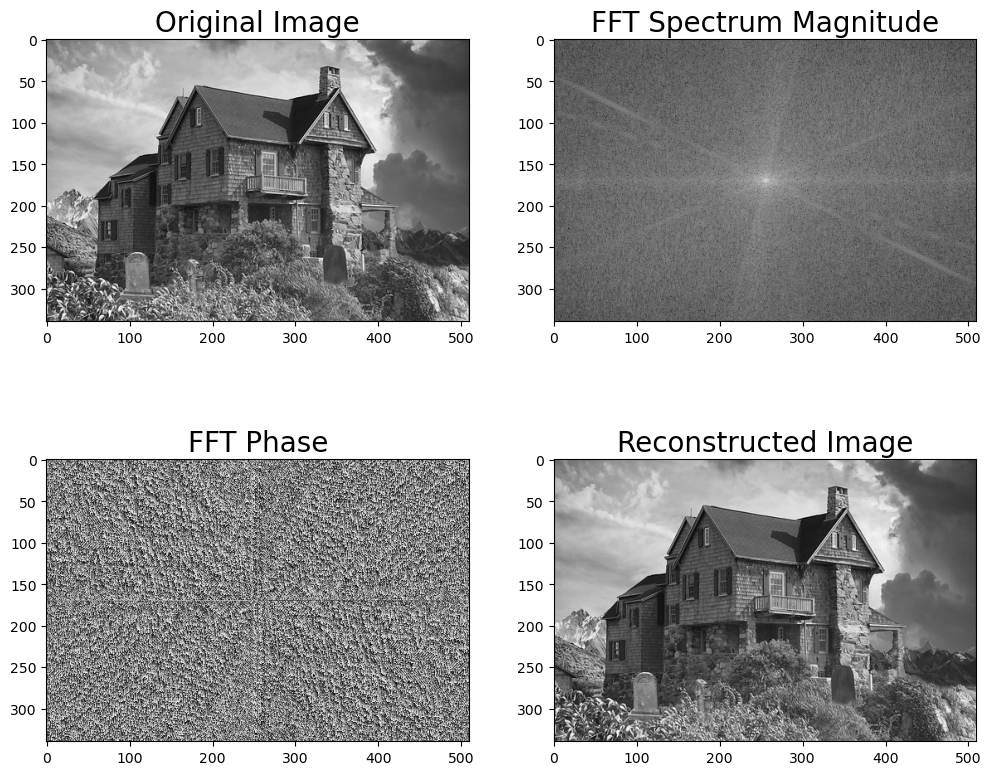

In [30]:
# Computing the magnitude and phase of a DFT

import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.io import imread
import numpy.fft as fp

# Đọc ảnh và chỉ lấy 3 kênh đầu tiên nếu ảnh có kênh alpha
image = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\house2.png')
if image.shape[-1] == 4:  # Kiểm tra xem ảnh có 4 kênh không
    image = image[..., :3]  # Giữ lại 3 kênh đầu tiên (RGB)

# Chuyển ảnh sang thang độ xám
im1 = rgb2gray(image)

# Thực hiện biến đổi Fourier 2D
freq1 = fp.fft2(im1)

# Tính độ lớn phổ Fourier
magnitude_spectrum = 20 * np.log10(0.01 + np.abs(fp.fftshift(freq1)))

# Tính pha của phổ Fourier
phase_spectrum = np.angle(fp.fftshift(freq1))

# Tái tạo lại ảnh từ phổ Fourier
im1_reconstructed = fp.ifft2(freq1).real

# Hiển thị kết quả
plt.figure(figsize=(12, 10))

# Ảnh gốc
plt.subplot(2, 2, 1)
plt.imshow(im1, cmap='gray')
plt.title('Original Image', size=20)

# Độ lớn phổ Fourier
plt.subplot(2, 2, 2)
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('FFT Spectrum Magnitude', size=20)

# Pha phổ Fourier
plt.subplot(2, 2, 3)
plt.imshow(phase_spectrum, cmap='gray')
plt.title('FFT Phase', size=20)

# Ảnh tái tạo từ phổ Fourier
plt.subplot(2, 2, 4)
plt.imshow(np.clip(im1_reconstructed, 0, 255), cmap='gray')
plt.title('Reconstructed Image', size=20)

plt.show()



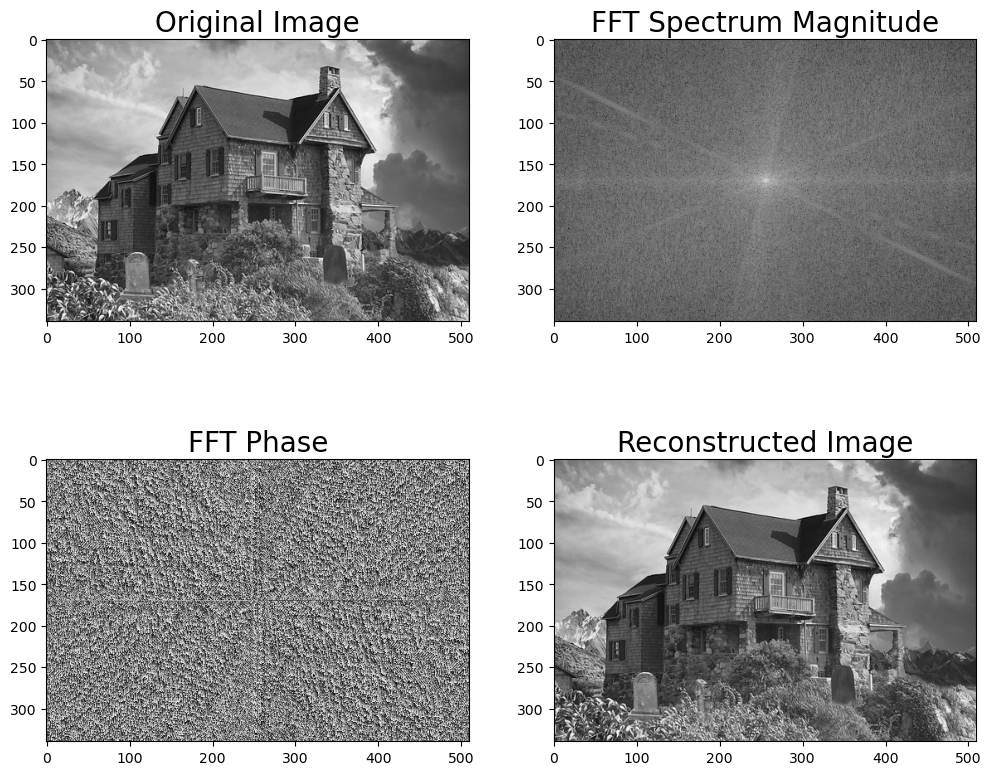

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.io import imread
import numpy.fft as fp

# Đọc ảnh và chỉ lấy 3 kênh đầu tiên nếu ảnh có kênh alpha
image = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\house2.png')
if image.shape[-1] == 4:  # Kiểm tra nếu ảnh có 4 kênh
    image = image[..., :3]  # Giữ lại 3 kênh đầu tiên (RGB)

# Chuyển đổi ảnh sang thang độ xám
im2 = rgb2gray(image)

# Thực hiện biến đổi Fourier 2D
freq2 = fp.fft2(im2)

# Tái tạo ảnh từ phổ Fourier
im2_reconstructed = fp.ifft2(freq2).real

# Hiển thị kết quả
plt.figure(figsize=(12, 10))

# Ảnh gốc
plt.subplot(2, 2, 1)
plt.imshow(im2, cmap='gray')
plt.title('Original Image', size=20)

# Độ lớn phổ Fourier
plt.subplot(2, 2, 2)
plt.imshow(20 * np.log10(0.01 + np.abs(fp.fftshift(freq2))), cmap='gray')
plt.title('FFT Spectrum Magnitude', size=20)

# Pha phổ Fourier
plt.subplot(2, 2, 3)
plt.imshow(np.angle(fp.fftshift(freq2)), cmap='gray')
plt.title('FFT Phase', size=20)

# Ảnh tái tạo từ phổ Fourier
plt.subplot(2, 2, 4)
plt.imshow(np.clip(im2_reconstructed, 0, 255), cmap='gray')
plt.title('Reconstructed Image', size=20)

plt.show()


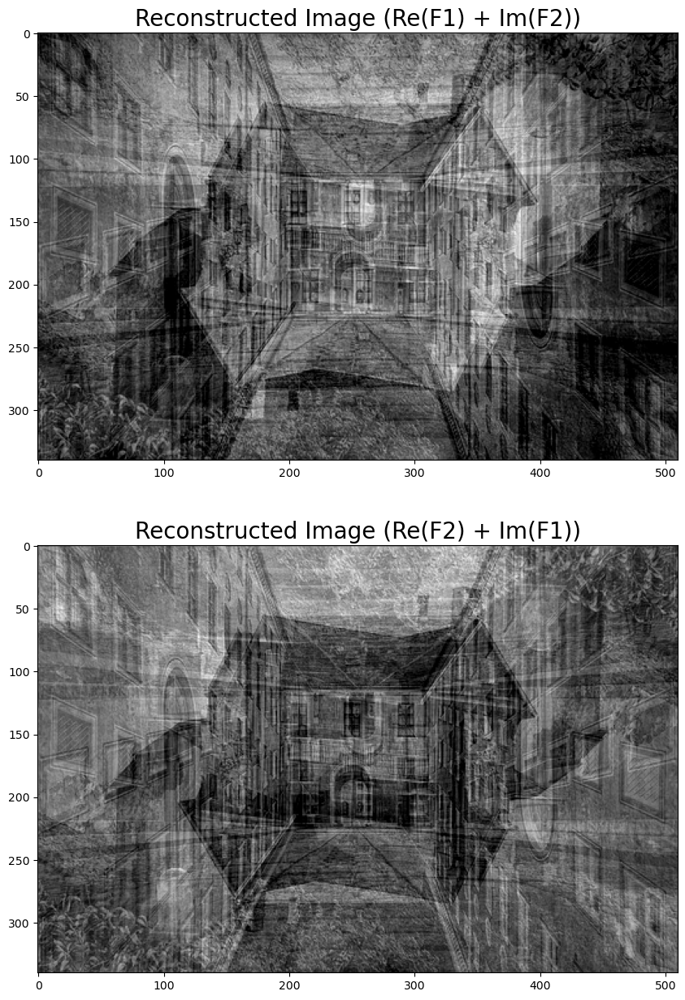

In [16]:
pylab.figure(figsize=(20,15))
im1_ = fp.ifft2(np.vectorize(complex)(freq1.real, freq2.imag)).real
im2_ = fp.ifft2(np.vectorize(complex)(freq2.real, freq1.imag)).real
pylab.subplot(211), pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F1) + Im(F2))', size=20)
pylab.subplot(212), pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F2) + Im(F1))', size=20)
pylab.show()

0.9921568627450982
(256, 256)


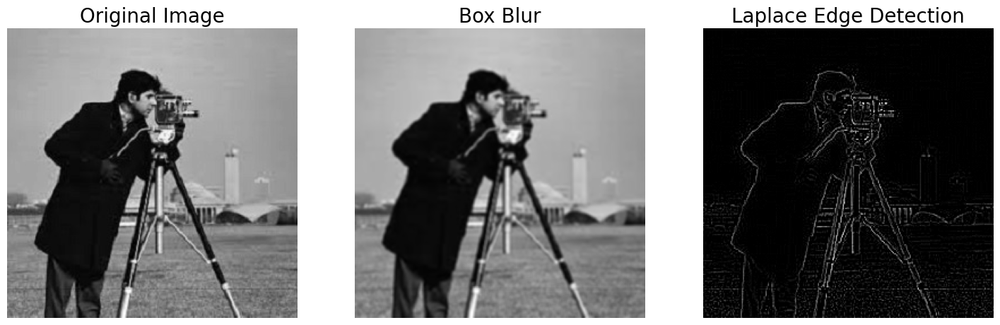

In [17]:
# Applying convolution to a grayscale image

import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.io import imread
from scipy import signal

# Đọc ảnh và chuyển sang thang độ xám
im = rgb2gray(imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\cameraman.jpg')).astype(float)

# Kiểm tra các thông số
print(np.max(im))  # Kỳ vọng giá trị tối đa là 1.0
print(im.shape)    # Kích thước ảnh

# Định nghĩa các kernel
blur_box_kernel = np.ones((3, 3)) / 9
edge_laplace_kernel = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])

# Áp dụng tích chập với các kernel
im_blurred = signal.convolve2d(im, blur_box_kernel, boundary='symm', mode='same')
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel, boundary='symm', mode='same'), 0, 1)

# Hiển thị kết quả
fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(18, 6))
axes[0].imshow(im, cmap='gray')
axes[0].set_title('Original Image', size=20)

axes[1].imshow(im_blurred, cmap='gray')
axes[1].set_title('Box Blur', size=20)

axes[2].imshow(im_edges, cmap='gray')
axes[2].set_title('Laplace Edge Detection', size=20)

# Tắt trục tọa độ
for ax in axes:
    ax.axis('off')

plt.show()


1.0
(1018, 1645, 3)


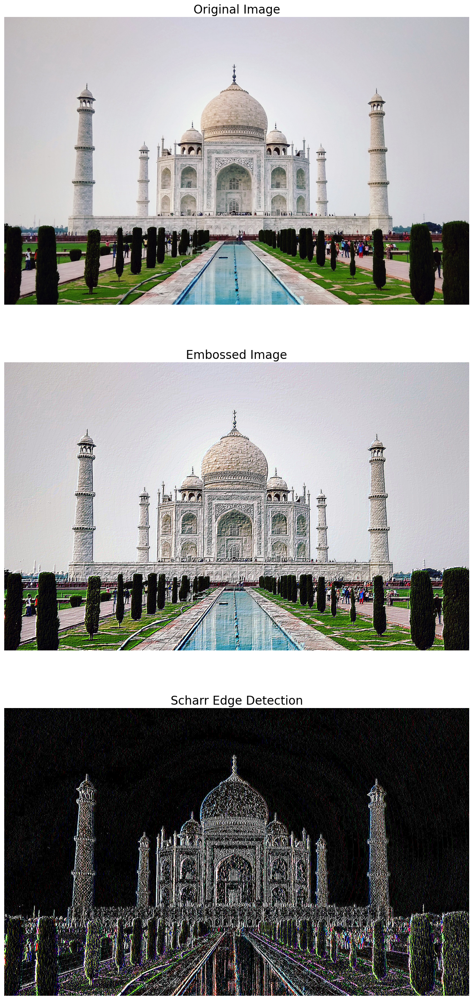

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from scipy import signal

# Đọc ảnh và chuẩn hóa giá trị của pixel trong khoảng [0, 1]
im = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\tajmahal.jpg') / 255.0

# Kiểm tra thông tin ảnh
print(np.max(im))   # Kiểm tra giá trị pixel lớn nhất, kỳ vọng là 1.0
print(im.shape)     # Kích thước ảnh

# Định nghĩa các kernel
emboss_kernel = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])
edge_schar_kernel = np.array([[-3-3j, 0-10j, 3-3j],
                              [-10+0j, 0+0j, 10+0j],
                              [-3+3j, 0+10j, 3+3j]])

# Áp dụng tích chập trên mỗi kênh màu cho hiệu ứng dập nổi và phát hiện biên
im_embossed = np.zeros_like(im)
im_edges = np.zeros_like(im)

for i in range(3):  # Duyệt qua các kênh màu R, G, B
    im_embossed[..., i] = np.clip(signal.convolve2d(im[..., i], emboss_kernel, mode='same', boundary='symm'), 0, 1)
    im_edges[..., i] = np.clip(np.real(signal.convolve2d(im[..., i], edge_schar_kernel, mode='same', boundary='symm')), 0, 1)

# Hiển thị kết quả
fig, axes = plt.subplots(nrows=3, figsize=(20, 30))

axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)

axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)

axes[2].imshow(im_edges)
axes[2].set_title('Scharr Edge Detection', size=20)

# Tắt trục tọa độ
for ax in axes:
    ax.axis('off')

plt.show()


255.0


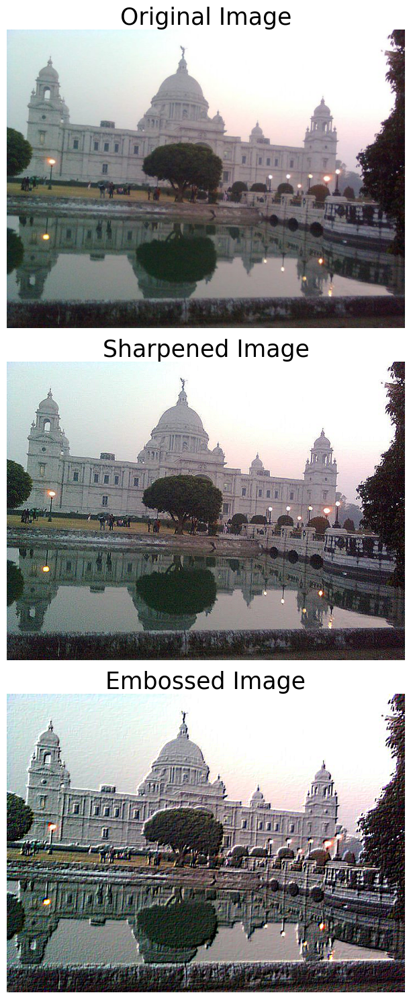

In [19]:
# Convolution with SciPy ndimage.convolve

import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from scipy import ndimage

# Đọc ảnh và chuyển đổi sang kiểu float
im = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\victoria_memorial.png').astype(float)
print(np.max(im))

# Định nghĩa các kernel
sharpen_kernel = np.array([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape((3, 3, 1))
emboss_kernel = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]]).reshape((3, 3, 1))

# Áp dụng tích chập với kernel làm nét
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8)

# Áp dụng tích chập với kernel dập nổi
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)

# Hiển thị kết quả
plt.figure(figsize=(10, 15))
plt.subplot(311), plt.imshow(im.astype(np.uint8)), plt.axis('off')
plt.title('Original Image', size=25)

plt.subplot(312), plt.imshow(im_sharp), plt.axis('off')
plt.title('Sharpened Image', size=25)

plt.subplot(313), plt.imshow(im_emboss), plt.axis('off')
plt.title('Embossed Image', size=25)

plt.tight_layout()
plt.show()


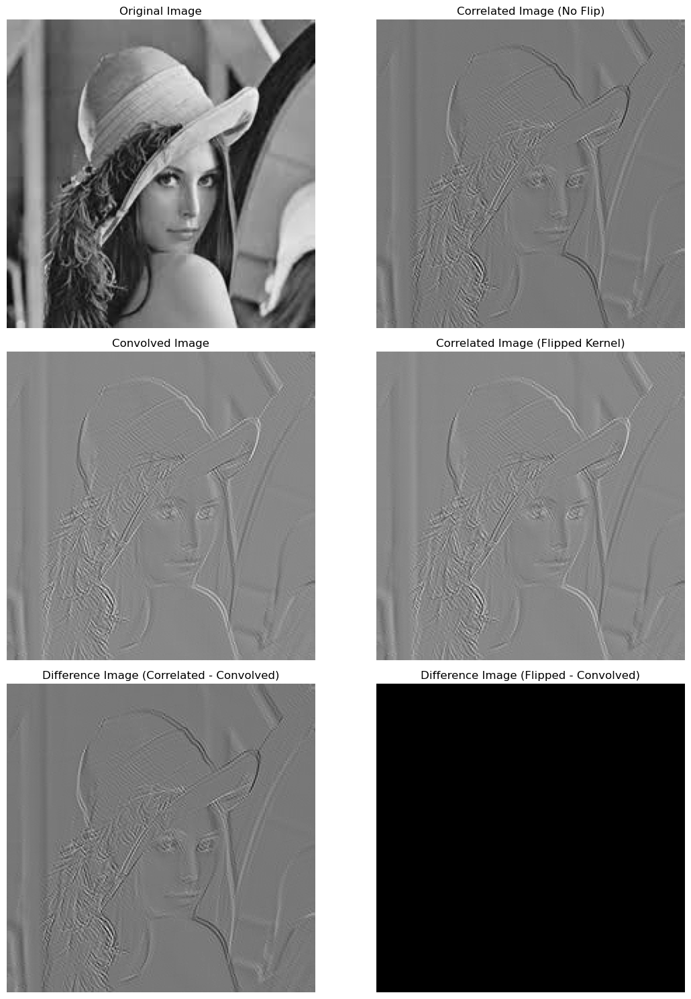

In [20]:
# Correlation versus convolution

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.ndimage import convolve
from skimage import color, io

# Đọc ảnh Lena và chuyển sang thang độ xám
image = io.imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\lena.jpg')
gray_image = color.rgb2gray(image)

# Kernel không đối xứng 3x3
ripple_kernel = np.array([[0, -1, np.sqrt(2)], [1, 0, -1], [-np.sqrt(2), 1, 0]])

# Tính kết quả của phép tương quan
correlated_image = signal.correlate2d(gray_image, ripple_kernel, boundary='symm', mode='same')

# Lật kernel theo cả hai chiều và tính kết quả của phép tương quan để mô phỏng tích chập
flipped_kernel = np.flip(ripple_kernel)
correlated_image_flipped = signal.correlate2d(gray_image, flipped_kernel, boundary='symm', mode='same')

# Tính kết quả của phép tích chập trực tiếp
convolved_image = convolve(gray_image, ripple_kernel, mode='nearest')

# Tính ảnh chênh lệch giữa tương quan không lật kernel và tích chập
difference_image = correlated_image - convolved_image
difference_image_flipped = correlated_image_flipped - convolved_image

# Hiển thị các kết quả
fig, axes = plt.subplots(3, 2, figsize=(12, 15))
axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 1].imshow(correlated_image, cmap='gray')
axes[0, 1].set_title('Correlated Image (No Flip)')

axes[1, 0].imshow(convolved_image, cmap='gray')
axes[1, 0].set_title('Convolved Image')
axes[1, 1].imshow(correlated_image_flipped, cmap='gray')
axes[1, 1].set_title('Correlated Image (Flipped Kernel)')

axes[2, 0].imshow(difference_image, cmap='gray')
axes[2, 0].set_title('Difference Image (Correlated - Convolved)')
axes[2, 1].imshow(difference_image_flipped, cmap='gray')
axes[2, 1].set_title('Difference Image (Flipped - Convolved)')

for ax in axes.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()


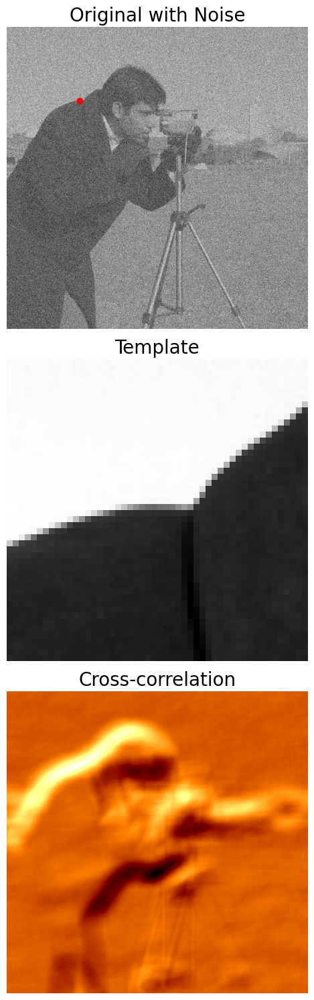

In [21]:
# Template matching with cross-correlation between the image and template

import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from skimage import data

# Sử dụng ảnh camera làm ví dụ và chuẩn hóa
face_image = data.camera().astype(float)
face_image = face_image - face_image.mean()

# Chọn vùng ảnh làm mẫu (ví dụ phần nhỏ ở giữa)
template_image = np.copy(face_image[100:150, 100:150])  # Thay đổi theo kích thước bạn muốn
template_image -= template_image.mean()

# Thêm nhiễu vào ảnh chính
face_image_noisy = face_image + np.random.randn(*face_image.shape) * 50  # thêm nhiễu ngẫu nhiên

# Tính toán tương quan chéo giữa ảnh và mẫu
correlation = signal.correlate2d(face_image_noisy, template_image, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(correlation), correlation.shape)  # Tìm vị trí phù hợp nhất

# Hiển thị ảnh gốc, mẫu và kết quả tương quan chéo
fig, (ax_original, ax_template, ax_correlation) = plt.subplots(3, 1, figsize=(6, 15))

ax_original.imshow(face_image_noisy, cmap='gray')
ax_original.set_title('Original with Noise', size=20)
ax_original.set_axis_off()

ax_template.imshow(template_image, cmap='gray')
ax_template.set_title('Template', size=20)
ax_template.set_axis_off()

ax_correlation.imshow(correlation, cmap='afmhot')
ax_correlation.set_title('Cross-correlation', size=20)
ax_correlation.set_axis_off()

# Đánh dấu vị trí tìm thấy mẫu
ax_original.plot(x, y, 'ro')

plt.tight_layout()
plt.show()
